# Setup

#### Imports

In [1]:
"""Normal estimation"""
ROOT_DIR = "/home/user/Documents/projects/Metaworld"

import sys
sys.path.append(ROOT_DIR)

%matplotlib widget  
import argparse
import gc
import os
import json
import random
from PIL import Image
from typing import Dict, List, Union

import cv2
import numpy as np

import gc
import matplotlib.pyplot as plt
import torch
from torchvision.transforms import PILToTensor
import torch.nn as nn
import numpy as np
import torch.nn.functional as F
from scipy.spatial.transform import Rotation as R
import importlib
from typing import List
from easydict import EasyDict as edict
from tqdm import tqdm

# visualization
import plotly.express as px
import plotly.graph_objects as go
from lightglue import viz2d
from einops import rearrange

import open3d as o3d
from open3d.web_visualizer import draw

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
[Open3D INFO] Resetting default logger to print to terminal.


In [2]:
from keyframes.align_ft_spair import dataset
from keyframes.align_ft_spair.utils import geo_utils, spair_utils, ft_align_utils, depth_match_utils, geom_utils, img_utils
from keyframes.align_ft_spair import pl_modules
from keyframes.align_ft_spair.ext import projection_network, utils_correspondence, utils_dataset
from utils import torch_utils

#### Setup Data

In [3]:
# params
spair_data_folder="/media/user/ssd2t/datasets2/SPair-71k"
embds_folder_geo="/media/user/EXTREMESSD/datasets/SPair-71k/geo"
embds_folder_sd="/media/user/EXTREMESSD/datasets/SPair-71k/DiffusionFeatures60x60"
img_files_np_path_train="/home/user/Documents/projects/diffusion-features/experiments/ft_align/aeroplane_train_files_unique.npy"
img_files_np_path_eval="/home/user/Documents/projects/diffusion-features/experiments/ft_align/aeroplane_eval_files_unique.npy"
depth_folder = "/media/user/EXTREMESSD/datasets/SPair-71k/miragold"
# kpt_indices=[3, 4, 5]
category="aeroplane"
img_size=960
embd_size=60
pad=True

img_files_train = np.load(img_files_np_path_train).tolist()
img_files_eval = np.load(img_files_np_path_eval).tolist()

flips_train = [False]
flips_eval = [False]

In [4]:
# load embeddings
img_embds_train, img_embds_hat_train = geo_utils.load_geo_embds(
    img_files_train,
    embds_folder_dino=embds_folder_geo,
    embds_folder_sd=embds_folder_sd,
    flips=flips_train,
)
img_embds_train = img_embds_train.detach().cpu()
img_embds_hat_train = img_embds_hat_train.detach().cpu()

# load embeddings
img_embds_eval, img_embds_hat_eval = geo_utils.load_geo_embds(
    img_files_eval,
    embds_folder_dino=embds_folder_geo,
    embds_folder_sd=embds_folder_sd,
    flips=flips_eval,
)
img_embds_eval = img_embds_eval.detach().cpu()
img_embds_hat_eval = img_embds_hat_eval.detach().cpu()

# build kpt_idx_to_kpt_embds
kpt_idx_to_kpt_embds_train, kpt_embd_coords_train, kpt_img_coords_train = spair_utils.build_kpt_idx_to_kpt_embds(
    img_files=img_files_train,
    img_embds_hat=img_embds_hat_train,
    spair_data_folder=spair_data_folder,
    img_size=img_size,
    embd_size=embd_size,
    pad=pad,
    flips=flips_train
)
kpt_idx_to_kpt_embds_eval, kpt_embd_coords_eval, kpt_img_coords_eval = spair_utils.build_kpt_idx_to_kpt_embds(
    img_files=img_files_eval,
    img_embds_hat=img_embds_hat_eval,
    spair_data_folder=spair_data_folder,
    img_size=img_size,
    embd_size=embd_size,
    pad=pad,
    flips=flips_eval
)

# average keypoint embeddings
kpt_features_avg_train = []
for kpt_index in range(30):
    kpt_features = kpt_idx_to_kpt_embds_train[kpt_index]
    if kpt_features is not None:
        kpt_features_avg_train.append(torch.mean(kpt_features, dim=0, keepdim=True))
kpt_features_avg_train = torch.cat(kpt_features_avg_train, dim=0)
# print(kpt_features_avg_train.shape)

# 1.1) load depth
depths_train = []
for img_file in img_files_train:
    fn = os.path.basename(img_file).split(".")[0]
    depth_file = f"{depth_folder}/{category}/depth_npy/{fn}_pred.npy"
    depth = np.load(depth_file)
    # NOTE instead of resizing depth we will resize and upscale attentions
    depths_train.append(depth)

depths_eval = []
for img_file in img_files_eval:
    fn = os.path.basename(img_file).split(".")[0]
    depth_file = f"{depth_folder}/{category}/depth_npy/{fn}_pred.npy"
    depth = np.load(depth_file)
    depths_eval.append(depth)

# 1.3) reproject to point clouds
xyz_train = []
for depth in depths_train:
    v0 = geom_utils.reproject_depth(depth)
    xyz_train.append(v0)

xyz_eval = []
for depth in depths_eval:
    v0 = geom_utils.reproject_depth(depth)
    xyz_eval.append(v0)

# TODO save xyz

# px.imshow(depths_padded_resized_train[20])

In [5]:
# 1.4) normal estimation
# => see model global, match local

normals_train = []

# create point cloud
for xyz in tqdm(xyz_train):
    pcd = o3d.geometry.PointCloud()
    h, w = xyz.shape[:2]
    pcd.points = o3d.utility.Vector3dVector(xyz.reshape((-1, 3)))
    pcd.estimate_normals()
    pcd.orient_normals_towards_camera_location()
    normals = np.asarray(pcd.normals)
    normals_train.append(normals.reshape((h, w, 3)))

normals_eval = []
for xyz in tqdm(xyz_eval):
    pcd = o3d.geometry.PointCloud()
    h, w = xyz.shape[:2]
    pcd.points = o3d.utility.Vector3dVector(xyz.reshape((-1, 3)))
    pcd.estimate_normals()
    pcd.orient_normals_towards_camera_location()
    normals = np.asarray(pcd.normals)
    normals_eval.append(normals.reshape((h, w, 3)))

# TODO save normals

# viewer is much better than the one from plotly...
# draw(pcd_moving)

100%|██████████| 27/27 [00:04<00:00,  6.09it/s]


# Approach

In [6]:
# TODO
# 0) Can we differentiate between front and side wheel? - done
#       => yes, but there are other issues when considering wings => we need to compute orientation for every embedding
# 1) Make it work if only one point is given - done
# 2) Make it work for multiple stable point pairs - done
# 3) (Extract blobs from attention) => already implemented
# 4) Implement function to determine noisyness in image => we only want blobs in attention (no edges)
# 5) Get better stable points, switch depending on top/bottom
# 6) Evaluate
# 7) Automatically find stable points

In [101]:
importlib.reload(spair_utils)

<module 'keyframes.align_ft_spair.utils.spair_utils' from '/home/user/Documents/projects/Metaworld/keyframes/align_ft_spair/utils/spair_utils.py'>

#### 0) Can we differentiate between fron and side wheel?

In [110]:
# 0) Can we differentiate between fron and side wheel?

# 0.1) Select images that contain front wheel and only one wing wheel
imgs_train_right_wheel = spair_utils.select_images_with_keypoint_indices([3,4], [5], kpt_img_coords_train)
imgs_train_left_wheel = spair_utils.select_images_with_keypoint_indices([3,5], [4], kpt_img_coords_train)
imgs_train_left_right_wheel = spair_utils.select_images_with_keypoint_indices([4,5], [], kpt_img_coords_train)
print(imgs_train_left_wheel, imgs_train_right_wheel, imgs_train_left_right_wheel, sep="\n")

[37]
[5, 12, 20, 23, 33, 34, 54]
[2, 3, 4, 7, 9, 10, 14, 16, 17, 19, 21, 25, 28, 30, 31, 32, 36, 43, 44, 47, 48, 49, 51, 53]


8


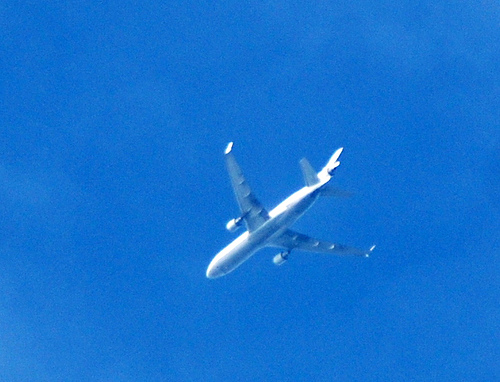

In [157]:
img_index = 8
print(img_index)
Image.open(img_files_train[img_index])

In [112]:
kpt_attn_unscaled = ft_align_utils.compute_attn(kpt_features_avg_train[8][None,:], img_embds_train[img_index][None,:])[0]
px.imshow(kpt_attn_unscaled)

In [113]:
xy_coords, kpt_attn = ft_align_utils.extract_local_maxima_from_query(
    img_embd=img_embds_train[img_index],
    query_embd=kpt_features_avg_train[5],
    h_orig=xyz_train[img_index].shape[0],
    w_orig=xyz_train[img_index].shape[1],
    k=2,
    min_distance=6
)
print(xy_coords)
print(kpt_attn[xy_coords[:,1], xy_coords[:,0]])
px.imshow(kpt_attn)

[[270 204]
 [254 220]]
tensor([0.0006, 0.0005])


In [114]:
for img_index in imgs_train_left_right_wheel:
    xy_coords, kpt_attn = ft_align_utils.extract_local_maxima_from_query(
        img_embd=img_embds_train[img_index],
        query_embd=kpt_features_avg_train[5],
        h_orig=xyz_train[img_index].shape[0],
        w_orig=xyz_train[img_index].shape[1],
        k=2,
        min_distance=6
    )
    # print(xy_coords)
    local_maxima_attn = kpt_attn[xy_coords[:,1], xy_coords[:,0]]
    if xy_coords.shape[0] > 1:
        tmp = local_maxima_attn[1] > 0.85 * local_maxima_attn[0]
        if not tmp:
            print(img_index, local_maxima_attn)

25 tensor([0.0006, 0.0004])
30 tensor([0.0006, 0.0005])
48 tensor([0.0005, 0.0004])


#### 1) Compute Similarity Matrix

In [106]:
a = torch.ones((4,3))
b = torch.ones((10,3))
# take difference between all vectors in a and b
diff = a[:,None,:] - b[None,:,:]
diff.shape

torch.Size([4, 10, 3])

In [107]:
torch.ones((3,1)) - torch.ones((1,4))

tensor([[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]])

In [139]:
def compute_orientation_with_normal_info_v3(
    xyz_candidates: torch.Tensor,
    stable_points_xyz_1: torch.Tensor,
    stable_point_normals_1: torch.Tensor,
    stable_points_xyz_2: torch.Tensor,
    stable_point_normals_2: torch.Tensor
):
    """ Compute orientation based 
    Args:
        xyz_candidates: (n_candidates, 3)
        stable_points_xyz_1: (n_stable, 3)
        stable_point_normals_1: (n_stable, 3)
        stable_points_xyz_2: (n_stable, 3)
        stable_point_normals_2: (n_stable, 3)
    Returns:
        angle_triangle_normal_to_stable_point_cross: (n,)
    """
    n_candidates = xyz_candidates.shape[0]
    n_stable = stable_point_normals_1.shape[0]
    stable_point_norms_1 = torch.norm(stable_point_normals_1, dim=-1, keepdim=False)
    stable_point_norms_2 = torch.norm(stable_point_normals_2, dim=-1, keepdim=False)

    cs1 = stable_points_xyz_1[:,None,:] - xyz_candidates[None,:,:]  # (n_stable, n_candidates, 3)
    cs2 = stable_points_xyz_2[:,None,:] - xyz_candidates[None,:,:]  # (n_stable, n_candidates, 3)
    mask = (stable_point_norms_1 > 1e-9) & (stable_point_norms_2 > 1e-9)
    triangle_normals = torch.zeros((n_stable, n_candidates, 3), dtype=torch.double)
    if torch.sum(mask) > 0:
        triangle_normals[mask] = torch.cross(cs1[mask], cs2[mask], dim=-1)
    triangle_normal_norms = torch.norm(triangle_normals, dim=-1, keepdim=True)
    triangle_normals[mask] /= (triangle_normal_norms[mask] + 1e-6)
    stable_point_normals_avg = (stable_point_normals_1 + stable_point_normals_2) / 2
    stable_point_normals_avg[~mask] = 0
    stable_point_normals_avg[mask] /= torch.norm(stable_point_normals_avg[mask], dim=-1, keepdim=True)
    
    # s2s1 will be our plane normal
    s2s1 = stable_points_xyz_1 - stable_points_xyz_2
    s2s1[mask] /= torch.norm(s2s1[mask], dim=-1, keepdim=True)
    stable_point_cross = torch.zeros_like(stable_point_normals_avg)
    stable_point_cross[mask] = torch.cross(stable_point_normals_avg[mask], s2s1[mask], dim=-1)

    # angle with from triangle normal to stable point cross rotated along s2s1
    angle_triangle_normal_to_stable_point_cross = torch.zeros((n_stable, n_candidates), dtype=torch.double)
    angle_triangle_normal_to_stable_point_cross[mask] = torch.atan2(
        torch.sum(torch.cross(stable_point_cross[mask][:,None,:], triangle_normals[mask], dim=-1) * s2s1[mask][:,None,:], dim=-1),
        torch.sum(triangle_normals[mask] * stable_point_cross[mask][:,None,:], dim=-1)
    )

    return angle_triangle_normal_to_stable_point_cross

In [140]:
# How to efficiently compute orientation for every image feature patch?

def compute_orientation(
    img_embd,
    img_xyz,
    img_normals,
    kpt_features_avg_train: torch.Tensor,
    # stable_indices: List[int],

    # TODO extend to multiple stable index pairs
    # stable_index_pair: List[int],
    stable_indices_1: List[int],
    stable_indices_2: List[int],
    thresh_rate=0.8,
    input_img_is_padded=True,
):
    # TODO should we gt data?
    kpt_attn, kpt_attn_max = ft_align_utils.compute_kpt_attn(
        img_embd,
        kpt_features_avg_train=kpt_features_avg_train
    )
    thresh = thresh_rate * torch.max(kpt_attn_max)

    # we need at least one pair of stable points
    m1 = kpt_attn_max[stable_indices_1] >= thresh
    m2 = kpt_attn_max[stable_indices_1] >= thresh
    m12 = m1 & m2
    if torch.sum(m12) == 0:
        return None, None, None, None, None, None, None, None

    # extract xyz and normal for keypoint indices that are above the threshold
    # TODO implement function: ft_align_utils.extract_stable_keypoints
    stable_xyz = torch.zeros((30, 3), dtype=torch.double)
    stable_normals = torch.zeros((30, 3), dtype=torch.double)
    stable_indices = list(set(stable_indices_1).union(set(stable_indices_2)))
    stable_indices_above_thresh = torch.tensor(stable_indices)[kpt_attn_max[stable_indices] >= thresh]
    for kpt_index in stable_indices_above_thresh:
        v, local_maxima = ft_align_utils.extract_xyz_from_attn(kpt_attn[kpt_index], img_xyz, input_img_is_padded=input_img_is_padded)
        stable_xyz[kpt_index] = v
        # stable_xyz[kpt_index_to_stable_index[kpt_index]], _ = ft_align_utils.extract_xyz_from_attn_avg_topk(
        #     kpt_attn[kpt_index], img_xyz, k=5, input_img_is_padded=input_img_is_padded)
        # stable_normals[kpt_index_to_stable_index[kpt_index]] = img_normals[local_maxima[0,1], local_maxima[0,0]]
        stable_normals[kpt_index], _ = ft_align_utils.extract_xyz_from_attn_avg_topk(
            kpt_attn[kpt_index], img_normals, k=5, input_img_is_padded=input_img_is_padded)
    stable_points_xyz_1 = stable_xyz[stable_indices_1,:]
    stable_point_normals_1 = stable_normals[stable_indices_1,:]
    stable_points_xyz_2 = stable_xyz[stable_indices_2,:]
    stable_point_normals_2 = stable_normals[stable_indices_2,:]

    # compute orientation (angle) for kpt_index_1 and kpt_index_2
    # TODO extract img xyz candidates or at least downsample (?)
    h, w = img_xyz.shape[:2]
    n_stable_pairs = len(stable_indices_1)
    orientations = compute_orientation_with_normal_info_v3(
        img_xyz.reshape((-1,3)), stable_points_xyz_1, stable_point_normals_1, stable_points_xyz_2, stable_point_normals_2
    )

    return orientations.reshape((n_stable_pairs, h, w))

In [158]:
img_index = 8
orientations = compute_orientation(
    img_embd=img_embds_train[img_index],
    img_xyz=torch_utils.to_torch(xyz_train[img_index], device="cpu"),
    img_normals=torch_utils.to_torch(normals_train[img_index], device="cpu"),
    kpt_features_avg_train=kpt_features_avg_train,
    # stable_indices: List[int],

    # TODO extend to multiple stable index pairs
    # stable_index_pair: List[int],
    stable_indices_1=[1,23, 0],
    stable_indices_2=[0,0, 24],
    thresh_rate=0.8,
    input_img_is_padded=True,
)
orientations = orientations % (2 * np.pi)

torch.Size([3])
torch.Size([3])
torch.Size([3])
torch.Size([3])


In [137]:
orientations.shape

torch.Size([1, 333, 500])

In [159]:
px.imshow(orientations[2])

#### Get additional stable points

In [ ]:
# NOTE we need to invert normal at bottom

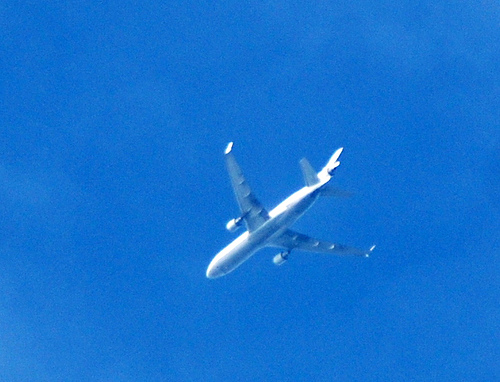

In [15]:
Image.open(img_files_train[8])

In [16]:
px.imshow(np.array(Image.open(img_files_train[8])))

In [ ]:
# img_index = 8
# x,y = 235, 256

In [20]:
ft, x_embd, y_embd = ft_align_utils.get_img_embd_at_xy_orig(235, 256, img_embds_hat_train[8], embd_w=60, img_w=img_size, angle_deg=0, flip=False, pad=True)

In [33]:
img_idx_q = 8
img_orig_height, img_orig_width = depths_train[img_idx_q].shape[:2]
x_embd, y_embd = spair_utils.transform_image_coords(x_orig=235, y_orig=256, img_orig_width=img_orig_width, img_orig_height=img_orig_height, img_new_size=60, pad=True)
ft = img_embds_hat_train[img_idx_q][:, y_embd, x_embd]

In [32]:
img_embds_hat_train[img_idx_q].shape

torch.Size([2048, 60, 60])

In [25]:
print(x_embd, y_embd)

14 16


In [31]:
ft.shape

torch.Size([60])

In [ ]:
view_from_bttom = [8,9]

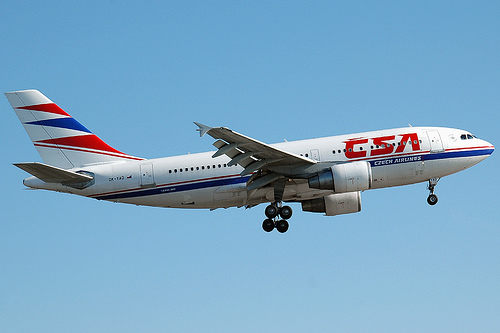

In [64]:
Image.open(img_files_train[11])

In [59]:
img_idx_test = 9
attn = ft_align_utils.compute_attn(ft[None,:], img_embds_train[img_idx_test][None,:])[0]
px.imshow(attn)

In [65]:
img_idx_test = 11
attn = ft_align_utils.compute_attn(kpt_features_avg_train[2][None,:], img_embds_train[img_idx_test][None,:])[0]
px.imshow(attn)

In [18]:
img_size

960

#### Determine noisyness in attention